# Dimension Reduction by Categories and Mechanics alone

Previous attempt combined analysis of categories and mechanics simultaneously. It is also possible collectors by similar Categories (themes) while differentiating Mechanics. So let's generate pca and t-sne for games based on those attributes alone.

In [1]:
#General libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
%matplotlib inline

#Regular expression
import re

# Applying Dimensionality Reduction

https://www.kdnuggets.com/2015/05/7-methods-data-dimensionality-reduction.html

In [3]:
# Load csv we had saved
ga = pd.read_csv('bgg game attributes edited.csv')

#Drop the first column (just indices)
ga.drop('Column1', inplace=True, axis=1)

#Rename headers with the actual headings (stored in first row)
ga.rename(columns=ga.iloc[0], inplace=True)
ga.drop(0, inplace=True, axis=0)
ga.reset_index(drop=True, inplace=True)

C:\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:2723: DtypeWarning: Columns (2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [4]:
#Set up PCA-dataset; remove text
ga_to_std = ga.drop(['Game name','Game rank','Game ID','total categories','total mechanics'], axis=1)

In [6]:
# Normalize the non-binary values: #players, playtime, weight
#Import sklearn standardscaler
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

#Fit and Transform via standard scaler
scaler.fit(ga_to_std[['#players','playtime','weight']])
scaled_ga = scaler.transform(ga_to_std[['#players','playtime','weight']])

#Concatenate the normalized columns to the binary columns
scaled_ga = pd.concat([pd.DataFrame(scaled_ga, columns=['#players','playtime','weight']),ga_to_std.drop(['#players','playtime','weight'],axis=1)],axis=1)

In [7]:
scaled_ga.head()

,#players,playtime,weight,Abstract Strategy,Action / Dexterity,Adventure,Age of Reason,American Civil War,American Indian Wars,American Revolutionary War,...,Storytelling,Take That,Tile Placement,Time Track,Trading,Trick-taking,Variable Phase Order,Variable Player Powers,Voting,Worker Placement
0,-0.088568,-0.048679,0.943120,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
1,-0.088568,0.241604,2.833330,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,-0.207549,0.144843,1.840645,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,-0.088568,0.048082,2.129397,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
4,-0.088568,0.241604,1.923440,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


# Mechanics only

In [50]:
scaled_mech = pd.concat([scaled_ga.loc[:,'#players':'weight'],scaled_ga.loc[:,'Acting':'Worker Placement']],axis=1)

In [51]:
scaled_mech.head()

,#players,playtime,weight,Acting,Action / Movement Programming,Action Point Allowance System,Area Control / Area Influence,Area Enclosure,Area Movement,Area-Impulse,...,Storytelling,Take That,Tile Placement,Time Track,Trading,Trick-taking,Variable Phase Order,Variable Player Powers,Voting,Worker Placement
0,-0.088568,-0.048679,0.943120,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
1,-0.088568,0.241604,2.833330,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,-0.207549,0.144843,1.840645,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,-0.088568,0.048082,2.129397,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
4,-0.088568,0.241604,1.923440,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,1,0,0


### PCA (mech)

In [52]:
# Import sklearn PCA
from sklearn.decomposition import PCA

#Apply PCA
pca = PCA()
mech_pca = pca.fit_transform(scaled_mech)

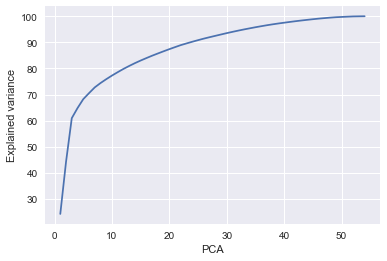

In [53]:
#Check what % variance is explained by each component
var_ex = pca.explained_variance_ratio_ * 100
var_cum = np.cumsum(var_ex[0:100])

plt.plot(np.arange(1,len(var_cum)+1),var_cum)
plt.xlabel('PCA')
plt.ylabel('Explained variance')

First 10 PCA gets almost 80% of the variance. Not too bad at all. If we go by mechanisms only, could consider using PCA.

### TSNE (mech)

In [54]:
# Import t-sne
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, verbose=1, perplexity=100, n_iter=2000)

tsne_results = tsne.fit_transform(scaled_mech)

[t-SNE] Computing pairwise distances...
[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Computed conditional probabilities for sample 1000 / 13955
[t-SNE] Computed conditional probabilities for sample 2000 / 13955
[t-SNE] Computed conditional probabilities for sample 3000 / 13955
[t-SNE] Computed conditional probabilities for sample 4000 / 13955
[t-SNE] Computed conditional probabilities for sample 5000 / 13955
[t-SNE] Computed conditional probabilities for sample 6000 / 13955
[t-SNE] Computed conditional probabilities for sample 7000 / 13955
[t-SNE] Computed conditional probabilities for sample 8000 / 13955
[t-SNE] Computed conditional probabilities for sample 9000 / 13955
[t-SNE] Computed conditional probabilities for sample 10000 / 13955
[t-SNE] Computed conditional probabilities for sample 11000 / 13955
[t-SNE] Computed conditional probabilities for sample 12000 / 13955
[t-SNE] Computed conditional probabilities for sample 13000 / 13955
[t-SNE] Computed conditional probabilities

In [55]:
tsne_results

array([[-2.24617584, -1.92865666],
       [-0.78050587,  0.45801838],
       [ 0.9873457 , -1.15551813],
       ..., 
       [-5.27640251, -3.79555098],
       [-2.49975486,  3.60095692],
       [ 5.63078062, -3.21692846]])

In [56]:
df_mech = pd.concat([ga['Game name'],
                pd.DataFrame(tsne_results, columns=['Ax1','Ax2'])],
               axis=1)

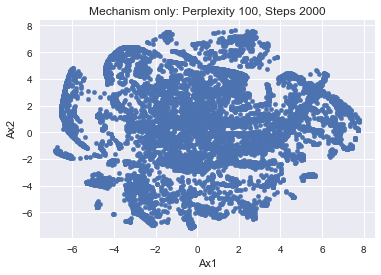

In [57]:
# See the t-sne plot and save it
ts= df_mech.plot(x='Ax1',y='Ax2',kind='scatter',title='Mechanism only: Perplexity 100, Steps 2000')

#ts.get_figure().savefig('ts_50perp.png')

In [58]:
# Save our tsne results for future use
df_mech.to_csv('bgg mech-only tsne coordinates.csv', encoding='utf-8')

# Categories only

In [28]:
scaled_cat = pd.concat([scaled_ga.loc[:,'#players':'weight'],scaled_ga.loc[:,'Abstract Strategy':'Zombies']],axis=1)

In [29]:
scaled_cat.head()

,#players,playtime,weight,Abstract Strategy,Action / Dexterity,Adventure,Age of Reason,American Civil War,American Indian Wars,American Revolutionary War,...,Transportation,Travel,Trivia,Video Game Theme,Vietnam War,Wargame,Word Game,World War I,World War II,Zombies
0,-0.088568,-0.048679,0.943120,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,-0.088568,0.241604,2.833330,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,-0.207549,0.144843,1.840645,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,-0.088568,0.048082,2.129397,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,-0.088568,0.241604,1.923440,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


### PCA (categories)

In [30]:
# Import sklearn PCA
from sklearn.decomposition import PCA

#Apply PCA
pca = PCA()
cat_pca = pca.fit_transform(scaled_cat)

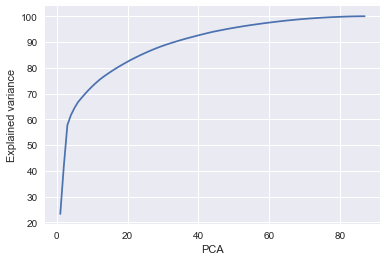

In [31]:
#Check what % variance is explained by each component
var_ex = pca.explained_variance_ratio_ * 100
var_cum = np.cumsum(var_ex[0:100])

plt.plot(np.arange(1,len(var_cum)+1),var_cum)
plt.xlabel('PCA')
plt.ylabel('Explained variance')

PCA doesn't seem as good for categories as it is for mechanics. Still can reduce number of dimensions to about 40 and still have 90%ish variance explained.

### TSNE (categories)

In [45]:
# Import t-sne
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, verbose=1, perplexity=100, n_iter=2000)

tsne_results = tsne.fit_transform(scaled_cat)

[t-SNE] Computing pairwise distances...
[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Computed conditional probabilities for sample 1000 / 13955
[t-SNE] Computed conditional probabilities for sample 2000 / 13955
[t-SNE] Computed conditional probabilities for sample 3000 / 13955
[t-SNE] Computed conditional probabilities for sample 4000 / 13955
[t-SNE] Computed conditional probabilities for sample 5000 / 13955
[t-SNE] Computed conditional probabilities for sample 6000 / 13955
[t-SNE] Computed conditional probabilities for sample 7000 / 13955
[t-SNE] Computed conditional probabilities for sample 8000 / 13955
[t-SNE] Computed conditional probabilities for sample 9000 / 13955
[t-SNE] Computed conditional probabilities for sample 10000 / 13955
[t-SNE] Computed conditional probabilities for sample 11000 / 13955
[t-SNE] Computed conditional probabilities for sample 12000 / 13955
[t-SNE] Computed conditional probabilities for sample 13000 / 13955
[t-SNE] Computed conditional probabilities

In [46]:
tsne_results

array([[-1.41581331,  1.50841553],
       [-3.39984793,  0.53584346],
       [ 3.43117472,  0.5283354 ],
       ..., 
       [-0.59630748,  4.82506236],
       [ 2.66261592,  4.89451686],
       [-2.63606513, -5.47686851]])

In [47]:
df_cat = pd.concat([ga['Game name'],
                pd.DataFrame(tsne_results, columns=['Ax1','Ax2'])],
               axis=1)

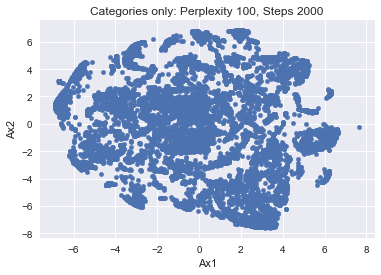

In [48]:
# See the t-sne plot and save it
ts= df_cat.plot(x='Ax1',y='Ax2',kind='scatter',title='Categories only: Perplexity 100, Steps 2000')

#ts.get_figure().savefig('ts_50perp.png')

In [49]:
# Save our tsne results for future use
df_cat.to_csv('bgg cat-only tsne coordinates.csv', encoding='utf-8')

## Interactive Plot

We can also graph the data to an interactive plot if we want to do some light exploration.

In [59]:
# Import plotly and cufflinks

from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

print(__version__) # requires version >= 1.9.0

import plotly.graph_objs as go

import cufflinks as cf

# For Notebooks
init_notebook_mode(connected=True)

# For offline use
cf.go_offline()

2.0.6


In [60]:
df_mech.iplot(kind='scatter',x='Ax1',y='Ax2',mode='markers',size=5,text='Game name')

In [61]:
df_cat.iplot(kind='scatter',x='Ax1',y='Ax2',mode='markers',size=5,text='Game name')